# imports

In [20]:
import anndata as ad
import scanpy as sc
import numpy as np
import seaborn as sns
import palettable
import pandas as pd
import scipy.io as sio
import pickle
import sys
import scipy
sys.path.append('/home/yzy/bioSIMS/code/analysis')
from utils_220 import *
# sc.set_figure_params(dpi=500, color_map='viridis')
sc.set_figure_params(dpi=500, color_map='viridis',dpi_save=500,transparent=True)

sc.settings.verbosity = 2
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

# %matplotlib inline


# functions

# data loading

## R3 loading

In [2]:
a_R3_path = 'figures/Supp/P19_R3/data.h5ad'

a_R3 = ad.read_h5ad(a_R3_path)

In [6]:
a_R3.uns['final_cls_colors'] = [c for c in a_R3.uns['final_cls_colors']]

## R1 loading

In [121]:
a_R1_path = 'figures/Supp/P19_R1/data.h5ad'

a_R1 = ad.read_h5ad(a_R1_path)

In [125]:
a_R1.uns['final_cls_colors'] = [c for c in a_R1.uns['final_cls_colors']]

## R2 loading

In [317]:
R2_dump = 'fig4_rep0_cls6_reorder_full.h5ad'
R1_dump = 'fig4_rep1_cls6_full_adddist.h5ad'
R4_dump = 'fig4_rep2_cls6_reorder_full.h5ad'
R3_dump = 'fig4_rep3_cls6_reorder_full.h5ad'
m_dump = 'figures/Fig2_dump_data/fig2_c8.h5ad'



a_R1 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R1_dump)
a_R2 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R2_dump)
a_R3 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R3_dump)
a_R4 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R4_dump)
a_m = ad.read_h5ad(m_dump)

In [333]:
a_R2.obs['final_cls'] = a_R2.obs['cls_5_reorder']
a_R1.obs['final_cls'] = a_R1.obs['cls_5_pca_reorder']
a_R4.obs['final_cls'] = a_R4.obs['cls_5_reorder']
a_R3.obs['final_cls'] = a_R3.obs['cls_6_bak_reorder']
a_m.obs['final_cls'] = a_m.obs['cls_8_reorder']

rep3_cls = np.array(a_R3.obs['cls_6_bak_reorder'].copy())
rep3_cls_tmp = rep3_cls.copy()
rep3_cls[rep3_cls_tmp=='4']='5'
rep3_cls[rep3_cls_tmp=='5']='4'


a_R3.obs['final_cls'] = rep3_cls
a_R3.obs['final_cls'] = a_R3.obs['final_cls'].astype('category')
cls_cmp = ['#006FFF','#13F4EF','#FAFF00','#FFBF00','#68FF00','#FF005C']
a_R1.uns['final_cls_colors'] = cls_cmp
a_R2.uns['final_cls_colors'] = cls_cmp
a_R3.uns['final_cls_colors'] = cls_cmp
a_R4.uns['final_cls_colors'] = cls_cmp
a_m.uns['final_cls_colors'] = [c for c in a_m.uns['cls_8_reorder_colors']]

In [332]:
a_m.uns['cls_8_reorder_colors']

array([[0.49803922, 0.23529412, 0.55294118],
       [0.06666667, 0.64705882, 0.4745098 ],
       [0.22352941, 0.41176471, 0.6745098 ],
       [0.94901961, 0.71764706, 0.00392157],
       [0.        , 0.5254902 , 0.58431373],
       [0.50196078, 0.72941176, 0.35294118],
       [0.90196078, 0.51372549, 0.0627451 ],
       [0.90588235, 0.24705882, 0.45490196]])

## mouse liver loading

In [35]:
a_m_path = '/home/yzy/ipynbs/figures/Fig2_dump_data/fig2_cluster5.h5ad'

a_m = ad.read_h5ad(a_m_path)

In [27]:
a_m.uns['cls_4_colors'] = [c for c in a_m.uns['cls_4_colors']]

# processing

## umap

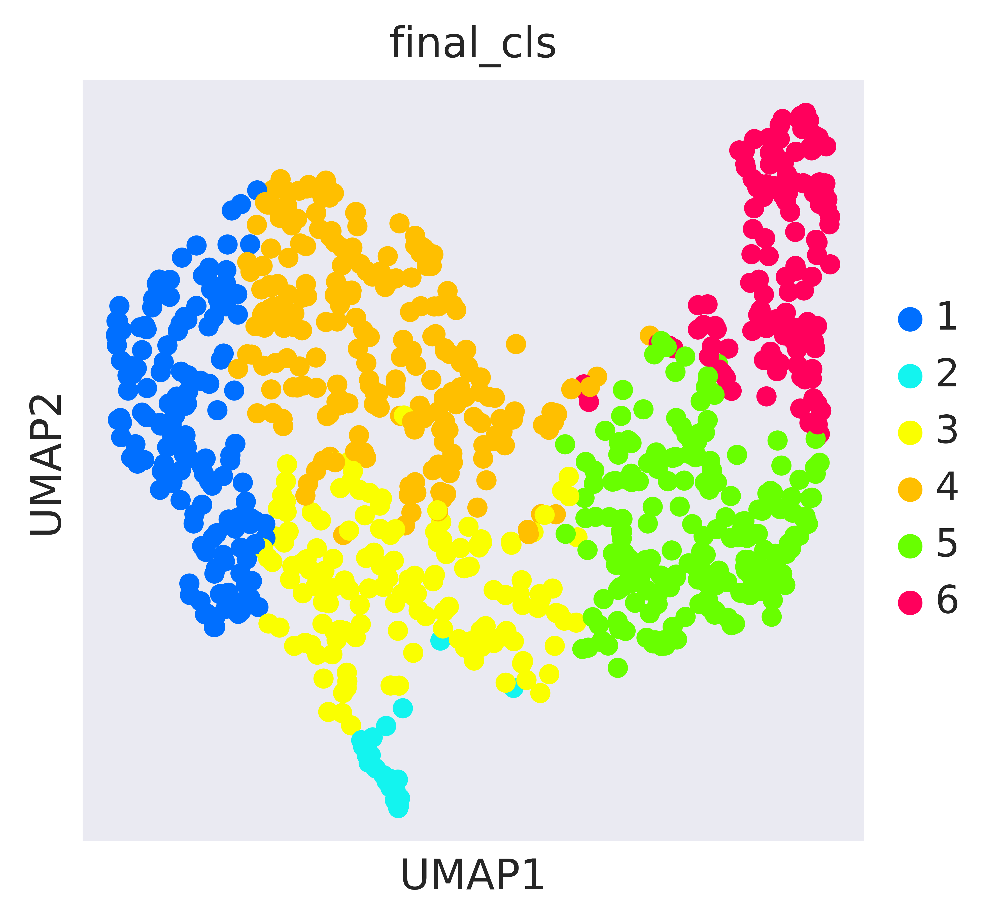

In [244]:
sc.pl.umap(a_R1,color='final_cls')

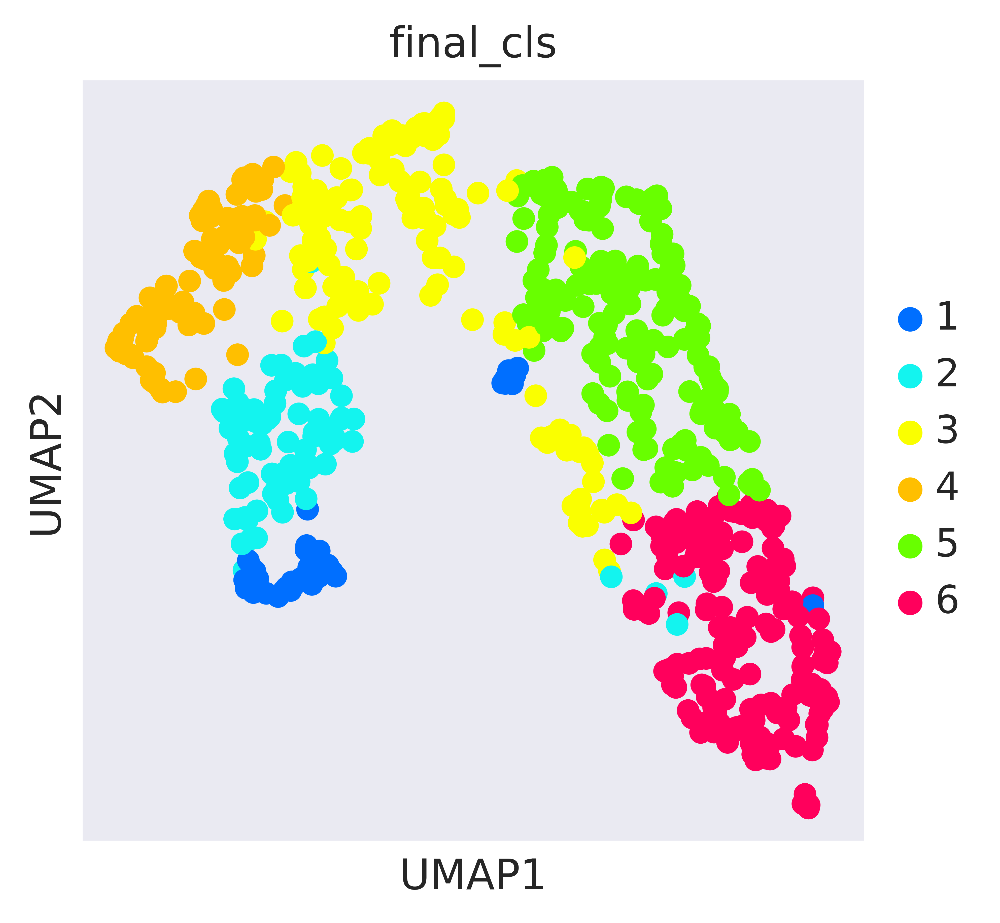

In [246]:
sc.pl.umap(a_R2,color='final_cls')

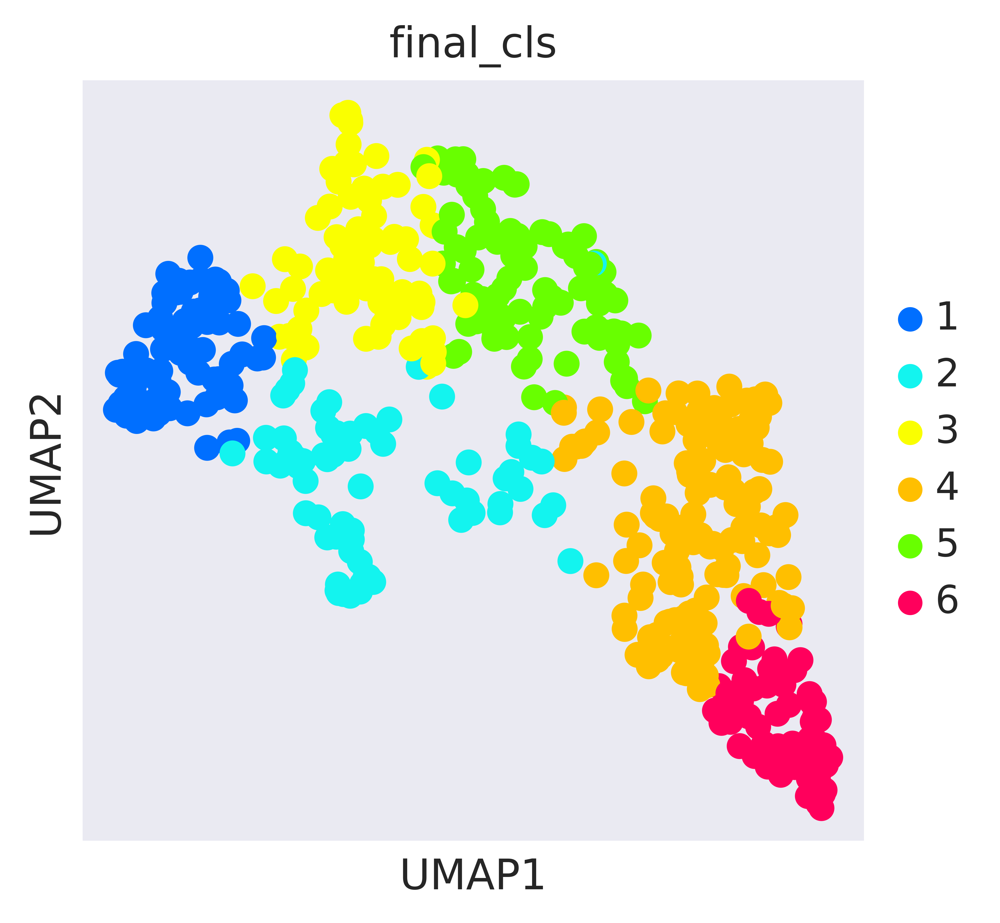

In [247]:
sc.pl.umap(a_R3,color='final_cls')

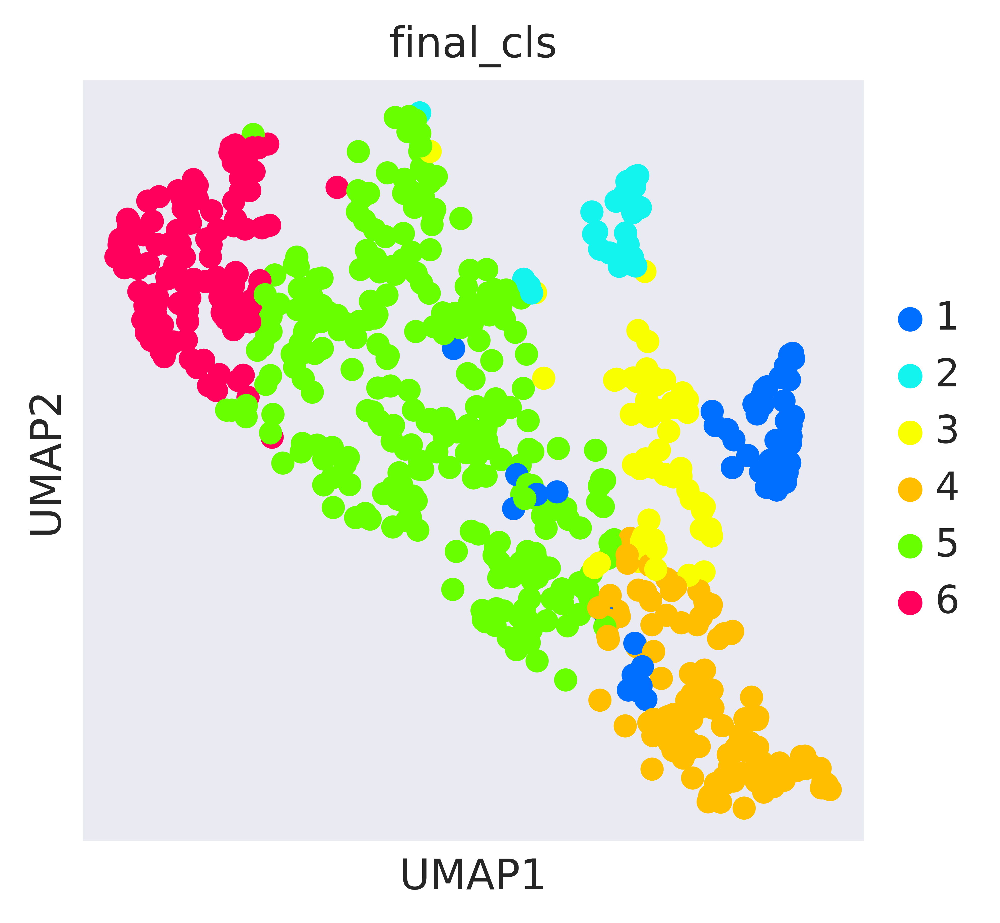

In [248]:
sc.pl.umap(a_R4,color='final_cls')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

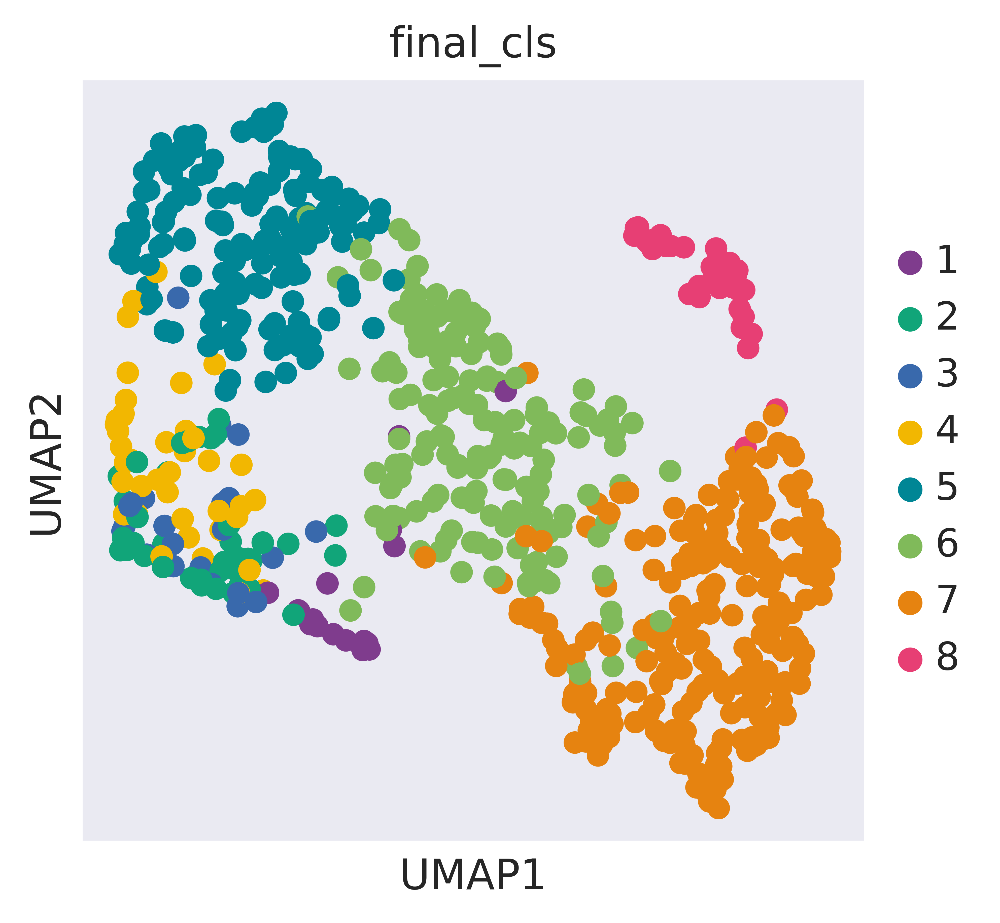

In [334]:
sc.pl.umap(a_m,color='final_cls')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

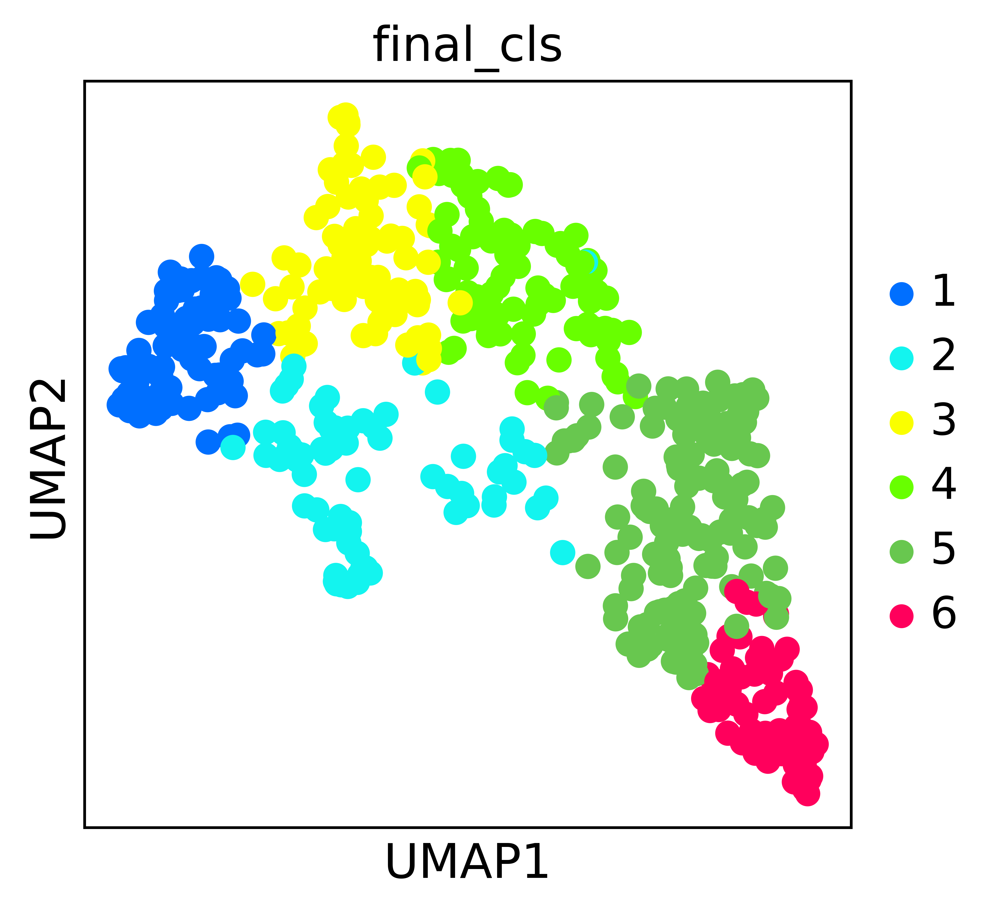

In [21]:
sc.pl.umap(a_R3,color='final_cls')

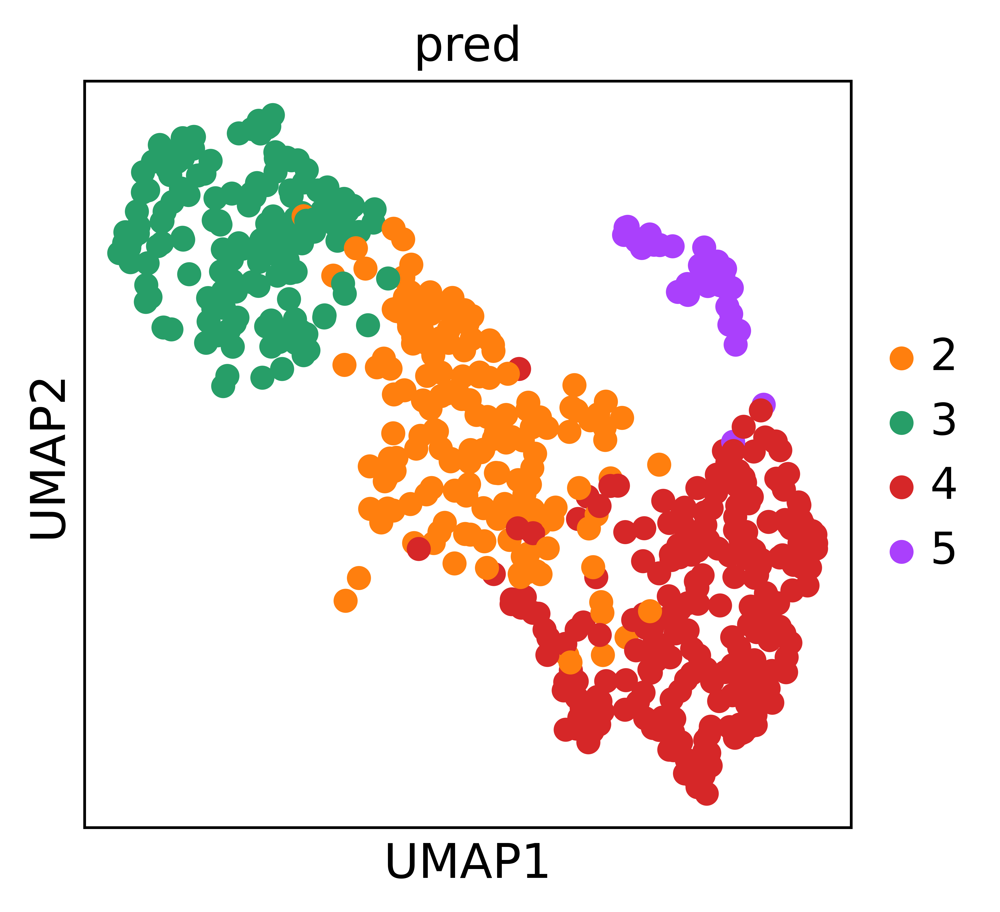

In [41]:
sc.pl.umap(a_m_hepa,color='pred')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


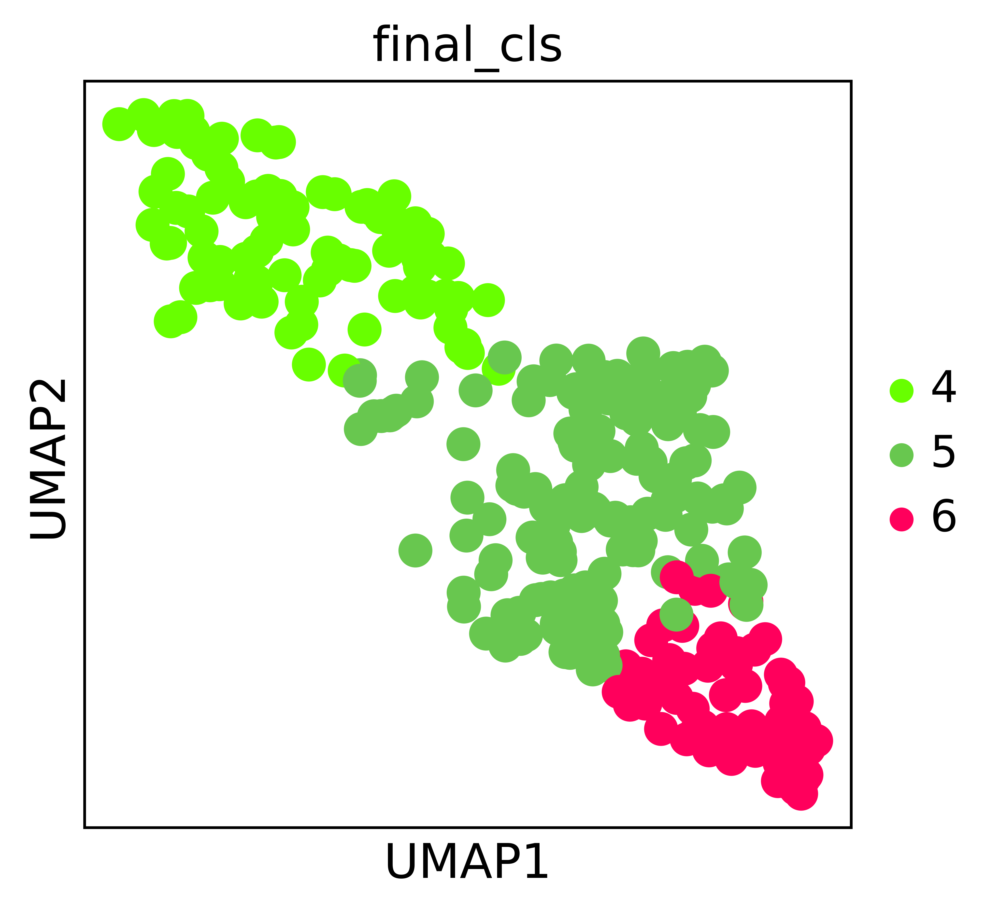

In [51]:
sc.pl.umap(a_R3_hepa,color='final_cls')

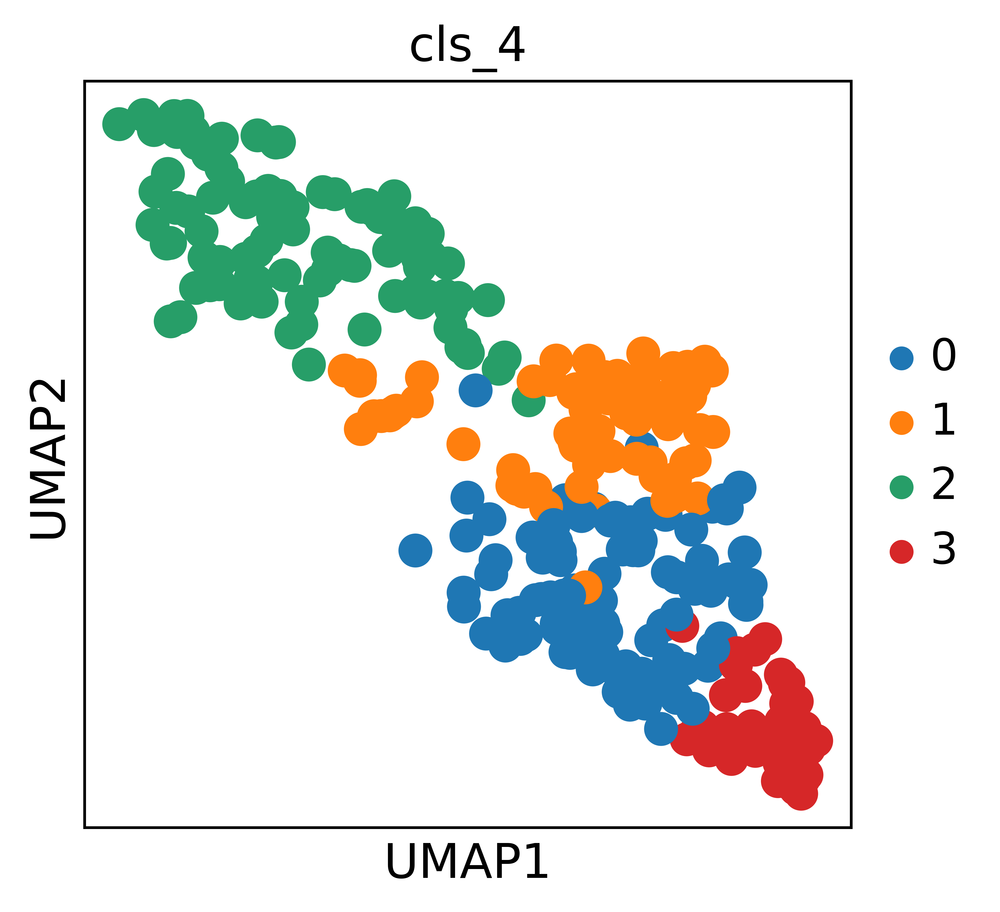

In [68]:
sc.pl.umap(a_R3_hepa,color='cls_4')

## extract hepa clusters

In [49]:
a_m_hepa_cls = ['2','3','4','5']
a_R3_hepa_cls = ['4','5','6']

In [50]:
a_m_hepa = a_m[a_m.obs['pred'].isin(a_m_hepa_cls)]
a_R3_hepa = a_R3[a_R3.obs['final_cls'].isin(a_R3_hepa_cls)]
a_R3_hepa.uns['final_cls_colors'] = [c for c in a_R3_hepa.uns['final_cls_colors']]

Trying to set attribute `.uns` of view, copying.


## R3 recluster

In [66]:
import SIMLR

input_rep = a_R3_hepa.obsm['cls_6_rep']

c=4
# start_main = time.time()
simlr = SIMLR.SIMLR_LARGE(c, 10, 0); ###This is how we initialize an object for SIMLR. the first input is number of rank (clusters) and the second input is number of neighbors. The third one is an binary indicator whether to use memory-saving mode. you can turn it on when the number of cells are extremely large to save some memory but with the cost of efficiency.
S, F,val, ind = simlr.fit(input_rep)
# print('Successfully Run SIMLR! SIMLR took %f seconds in total\n' % (time.time() -         start_main))
pred_y = simlr.fast_minibatch_kmeans(F,c)

SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



In [67]:
a_R3_hepa.obs['cls_4'] = pred_y.astype('str')
a_R3_hepa.obs['cls_4'] = a_R3_hepa.obs['cls_4'].astype('category')

## mouse recluster

## DE analysis

In [52]:
sc.tl.rank_genes_groups(a_m_hepa,groupby='pred')

ranking genes


Trying to set attribute `.uns` of view, copying.


    finished (0:00:00)


In [60]:
sc.pl.rank_genes_groups_heatmap(a_m_hepa,dendrogram=False,
                                standard_scale='var',cmap=heatmap_cmp,
                               swap_axes=True)

In [61]:
sc.tl.rank_genes_groups(a_R3_hepa,groupby='final_cls')

ranking genes
    finished (0:00:00)


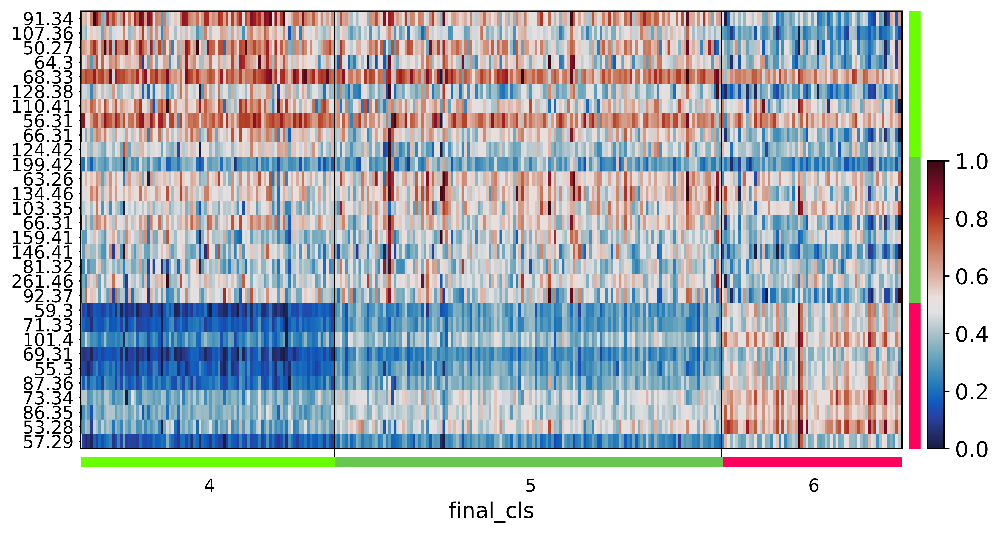

In [62]:
sc.pl.rank_genes_groups_heatmap(a_R3_hepa,dendrogram=False,
                                standard_scale='var',cmap=heatmap_cmp,
                               swap_axes=True)

In [69]:
sc.tl.rank_genes_groups(a_R3_hepa,groupby='cls_4')

ranking genes
    finished (0:00:00)


In [71]:
sc.pl.rank_genes_groups_heatmap(a_R3_hepa,dendrogram=False,groupby='cls_4',
                                standard_scale='var',cmap=heatmap_cmp,
                               swap_axes=True)

In [77]:
m_tmp = a_m_hepa.uns['rank_genes_groups']['names']

In [107]:
mm_tmp = [np.array(list(m)) for m in m_tmp]

In [110]:
np.vstack(mm_tmp).shape

(100, 4)

In [128]:
a_R1

AnnData object with n_obs × n_vars = 902 × 228 
    obs: 'cls_5', 'cls_5_pca', 'cls_5_pca_reorder', 'fibro_dist', 'fibro_dist_mum', 'cls_5_pca_reorder_IMlast', 'test', 'test_reorder', 'final_cls'
    uns: 'cls_5_colors', 'cls_5_pca_colors', 'cls_5_pca_reorder_IMlast_colors', 'cls_5_pca_reorder_colors', 'dendrogram_cls_5_pca', 'dendrogram_cls_5_pca_reorder', 'final_cls_colors', 'rank_genes_groups', 'rep_list', 'test_colors', 'test_reorder_colors'
    obsm: 'X_pca', 'X_umap', 'cls_5_pca_rep', 'cls_5_rep', 'spatial'

In [130]:
sc.tl.rank_genes_groups(a_m,n_genes=244,groupby='pred')
sc.tl.rank_genes_groups(a_R1,n_genes=228,groupby='final_cls')


ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)


In [263]:
np.sort(pval_mat[:,i])[k]

IndexError: index 5 is out of bounds for axis 1 with size 5

In [279]:
def get_m_from_p(a_use,pval_thre,method='pval_thre'):
#     a_use = a_m_hepa
#     pval_thre = 0.01

    rec2mat_fun = lambda rec: np.vstack([np.array(list(m)) for m in rec])
    name_mat = a_use.uns['rank_genes_groups']['names']
    pval_mat = a_use.uns['rank_genes_groups']['pvals_adj']
    score_mat = a_use.uns['rank_genes_groups']['scores']
    
    
    name_mat = rec2mat_fun(name_mat)
    pval_mat = rec2mat_fun(pval_mat)
    score_mat = rec2mat_fun(score_mat)
    n_cls = name_mat.shape[1]

    rst_list = []
    for i in range(n_cls):
        if method=='pval_thre':
            cur_idx = (pval_mat[:,i]<=pval_thre)
        elif method=='pval_topk':
            kth_p = np.sort(pval_mat[:,i])[pval_thre]
            cur_idx = (pval_mat[:,i]<=kth_p)
        elif method=='score_thre':
            cur_idx = (score_mat[:,i]>=pval_thre)
        elif method=='score_topk':
            kth_score = np.flip(np.sort(score_mat[:,i]))[pval_thre]
            cur_idx = (score_mat[:,i]>=kth_score)
            
        cur_m = name_mat[cur_idx,i]
        rst_list.append(cur_m)
        print(cur_m.shape[0])
    return rst_list



In [190]:
a_m_markers[2]

array(['91.36', '75.32', '128.39', '66.32', '144.41', '65.31', '134.48',
       '90.36', '64.31', '50.27', '181.42', '92.39', '117.42', '106.4',
       '107.4', '112.38', '103.36', '132.46', '133.47', '63.27', '78.32',
       '149.45', '131.46', '165.41', '104.39', '159.42', '79.29', '93.39',
       '125.47', '102.35', '150.5', '89.37', '143.43', '108.43', '68.34',
       '146.45', '105.38', '199.47', '158.46', '130.46', '118.43',
       '62.29', '122.43', '162.48', '88.36', '81.33', '67.34', '177.48',
       '120.42', '145.45', '203.56', '52.29', '74.33', '323.54', '160.47',
       '345.53', '385.56', '205.52', '183.47', '174.52', '168.52',
       '425.58', '148.47', '147.47', '172.52', '142.47', '219.5',
       '180.46', '261.5', '211.6', '194.55', '207.56', '369.57', '206.58',
       '277.53', '192.53', '116.43', '221.56', '217.55', '169.57',
       '56.31', '303.87', '161.47', '247.62', '237.61', '193.55',
       '224.58', '337.69', '301.54', '343.64', '77.31', '275.52',
       '21

In [183]:
a_m_markers = get_m_from_p(a_m,0.05)

108
3
170
169
24


In [186]:
a_R1_markers = get_m_from_p(a_R1,0.05)

36
133
99
6
141
144


In [200]:
bg_meta_list.shape

(261,)

In [201]:
m_meta_list = np.array(a_m.var_names).astype('float').astype('int')
R1_meta_list = np.array(a_R1.var_names).astype('float').astype('int')
bg_meta_list = np.hstack([m_meta_list,R1_meta_list])
bg_meta_list = np.unique(bg_meta_list)

In [218]:
total_genes = 19738
list1_n = 660
list2_n = 555
overlap_n = 58

p_d = scipy.stats.hypergeom.cdf(overlap_n + 1,total_genes,list1_n,list2_n)
p_e = scipy.stats.hypergeom.sf(overlap_n,total_genes,list1_n,list2_n)

In [233]:
# R1_hepa_list = [4,5]
# m_hepa_list = [2,3,4,5]

m_cls = ['endo','mid','91','69','69+']
R1_cls = ['kupf','fib','endo','im','69','69+']
pd_dict = {
    'mouse':[],
    'R1':[],
    'pval':[]
}
MIA_map = np.zeros(shape=(len(a_m_markers),len(a_R1_markers)))
for i in range(len(a_m_markers)):
    cur_m =  np.unique(a_m_markers[i].astype('float').astype('int'))
    for j in range(len(a_R1_markers)):
        cur_R1 = np.unique(a_R1_markers[j].astype('float').astype('int'))
        cur_overlap = np.intersect1d(cur_m,cur_R1).shape[0]
        cur_total = len(bg_meta_list)
        cur_list1 = max(cur_m.shape[0],cur_R1.shape[0])
        cur_list2 = min(cur_m.shape[0],cur_R1.shape[0])
        cur_p = scipy.stats.hypergeom.sf(cur_overlap-1,cur_total,cur_list1,cur_list2)
        cur_p_log = -np.log10(cur_p)
        
        print('m:{0}, R1:{1}, {2}/{3}/{4}/{5}, pval:{6}'.format(m_cls[i],R1_cls[j],cur_total,cur_list1,cur_list2,cur_overlap,cur_p_log))
        MIA_map[i,j] = cur_p_log
        pd_dict['mouse'].append(m_cls[i])
        pd_dict['R1'].append(R1_cls[j])
        pd_dict['pval'].append(cur_p_log)
        

m:endo, R1:kupf, 261/106/36/35, pval:14.017958448690802
m:endo, R1:fib, 261/133/106/77, pval:8.332766363677385
m:endo, R1:endo, 261/106/99/68, pval:12.34342288131992
m:endo, R1:im, 261/106/6/6, pval:2.38541914011348
m:endo, R1:69, 261/141/106/81, pval:8.954666037092505
m:endo, R1:69+, 261/144/106/88, pval:13.762156381312973
m:mid, R1:kupf, 261/36/3/1, pval:0.4430614386517395
m:mid, R1:fib, 261/133/3/2, pval:0.28868081817622676
m:mid, R1:endo, 261/99/3/1, pval:0.11772391503156339
m:mid, R1:im, 261/6/3/3, pval:5.1657323733427285
m:mid, R1:69, 261/141/3/2, pval:0.251465925433346
m:mid, R1:69+, 261/144/3/3, pval:0.778926745446985
m:91, R1:kupf, 261/168/36/34, pval:5.0291042539198925
m:91, R1:fib, 261/168/133/97, pval:2.6231582297052687
m:91, R1:endo, 261/168/99/74, pval:2.3706732647968205
m:91, R1:im, 261/168/6/6, pval:1.1620571764176386
m:91, R1:69, 261/168/141/101, pval:2.2400051452496097
m:91, R1:69+, 261/168/144/105, pval:2.970417070767556
m:69, R1:kupf, 261/167/36/35, pval:6.225063729

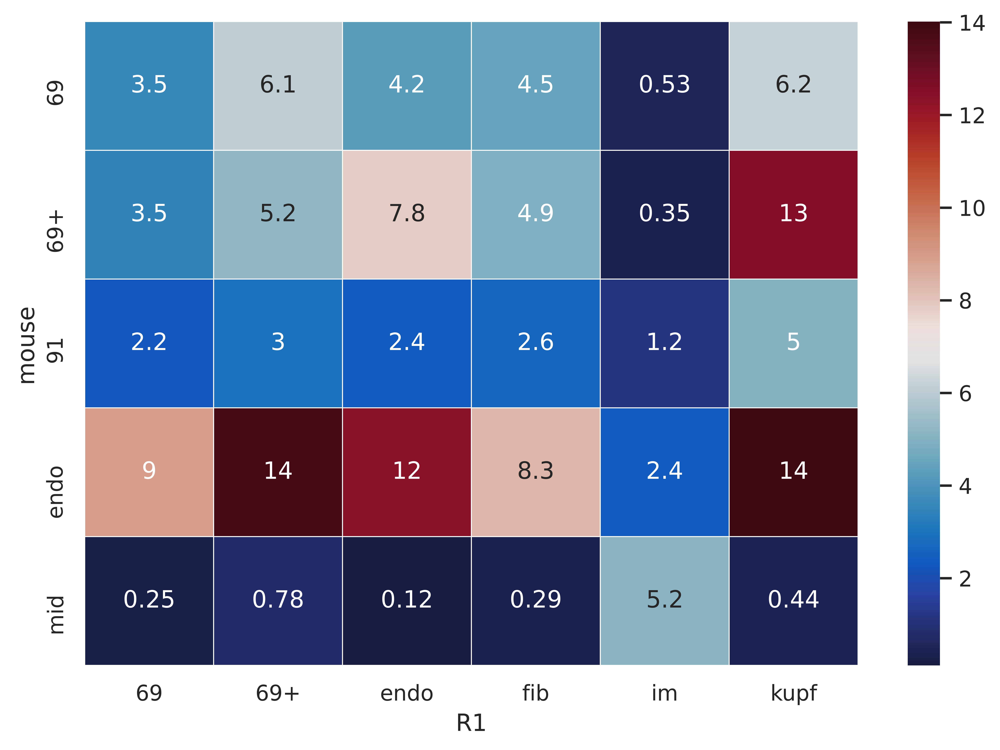

In [234]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
flights_long = pd.DataFrame(pd_dict)
# index='foo', columns='bar', values='baz'
flights = flights_long.pivot(index="mouse", columns="R1", values="pval")

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(flights, annot=True,  linewidths=.5, ax=ax,cmap=heatmap_cmp,square=True)

# human analysis

In [324]:
np.unique(a_m.obs['final_cls'])

array(['1', '2', '3', '4', '5', '6', '7', '8'], dtype=object)

In [325]:
# a_use1 = a_m[a_m.obs['pred'].isin(['2','3','4','5'])].copy()
# a_use2 = a_R1[a_R1.obs['final_cls'].isin(['5','6'])].copy()

a_use1 = a_m.copy()
a_use2 = a_R1[a_R1.obs['final_cls'].isin(['2','3','5','6'])].copy()


In [309]:
a_use1.shape

(603, 244)

In [326]:
sc.tl.rank_genes_groups(a_use1,n_genes=a_use1.shape[0],groupby='final_cls')
sc.tl.rank_genes_groups(a_use2,n_genes=a_use2.shape[0],groupby='final_cls')


ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)


In [345]:
a_use1_markers = get_m_from_p(a_use1,20,method='score_topk')
a_use2_markers = get_m_from_p(a_use2,20,method='score_topk')

21
21
21
21
21
21
21
21
21
21
21
21


In [328]:
a_use1_meta_list = np.array(a_use1.var_names).astype('float').astype('int')
a_use2_meta_list = np.array(a_use2.var_names).astype('float').astype('int')
bg_meta_list = np.hstack([a_use1_meta_list,a_use2_meta_list])
bg_meta_list = np.unique(bg_meta_list)

In [329]:
len(bg_meta_list)

261

In [294]:
a_use1_markers[0]

array(['63.25', '181.39', '79.27', '134.45', '90.35', '197.38', '103.34',
       '159.39', '199.4', '128.36', '92.36'], dtype='<U6')

In [295]:
a_use2_markers[0]

array(['76.3', '60.27', '77.3', '61.28', '136.42', '179.48', '78.31',
       '137.39', '100.34', '219.5', '178.44'], dtype='<U6')

In [348]:
# R1_hepa_list = [4,5]
# m_hepa_list = [2,3,4,5]

# a_use1_cls = ['fibro','endo','kupf','im','69-','69+']
# a_use2_cls = ['fibro','endo','kupf','im','69-','69+']

a_use1_cls = ['Other','Endothelial cell C2','Endothelial cell C1',
              'Kupffer cell','Hepatocyte C4','Hepatocyte C3','Hepatocyte C2','Hepatocyte C1']
a_use2_cls = ['Endothelial cell','Kupffer cell','Hepatocyte C2','Hepatocyte C1']

pd_dict = {
    'use1':[],
    'use2':[],
    'pval':[]
}
MIA_map = np.zeros(shape=(len(a_use1_markers),len(a_use2_markers)))
for i in range(len(a_use1_markers)):
    cur_use1 =  np.unique(a_use1_markers[i].astype('float').astype('int'))
    for j in range(len(a_use2_markers)):
        cur_use2 = np.unique(a_use2_markers[j].astype('float').astype('int'))
        cur_overlap = np.intersect1d(cur_use1,cur_use2).shape[0]
        cur_total = len(bg_meta_list)
        cur_list1 = max(cur_use1.shape[0],cur_use2.shape[0])
        cur_list2 = min(cur_use1.shape[0],cur_use2.shape[0])
        cur_p = scipy.stats.hypergeom.sf(cur_overlap-1,cur_total,cur_list1,cur_list2)
        cur_p_log = -np.log10(cur_p)
        
        print('m:{0}, R1:{1}, {2}/{3}/{4}/{5}, pval:{6}'.format(a_use1_cls[i],a_use2_cls[j],cur_total,cur_list1,cur_list2,cur_overlap,cur_p_log))
        MIA_map[i,j] = cur_p_log
        pd_dict['use1'].append(a_use1_cls[i])
        pd_dict['use2'].append(a_use2_cls[j])
        pd_dict['pval'].append(cur_p_log)
        

m:Other, R1:Endothelial cell, 261/21/21/0, pval:-0.0
m:Other, R1:Kupffer cell, 261/21/21/1, pval:0.07543730806761434
m:Other, R1:Hepatocyte C2, 261/21/21/1, pval:0.07543730806761434
m:Other, R1:Hepatocyte C1, 261/21/21/0, pval:-0.0
m:Endothelial cell C2, R1:Endothelial cell, 261/21/20/8, pval:4.519479522772237
m:Endothelial cell C2, R1:Kupffer cell, 261/21/20/11, pval:8.264568646012194
m:Endothelial cell C2, R1:Hepatocyte C2, 261/21/20/0, pval:-0.0
m:Endothelial cell C2, R1:Hepatocyte C1, 261/21/20/0, pval:-0.0
m:Endothelial cell C1, R1:Endothelial cell, 261/21/21/9, pval:5.42533495189608
m:Endothelial cell C1, R1:Kupffer cell, 261/21/21/12, pval:9.405958110273044
m:Endothelial cell C1, R1:Hepatocyte C2, 261/21/21/0, pval:-0.0
m:Endothelial cell C1, R1:Hepatocyte C1, 261/21/21/0, pval:-0.0
m:Kupffer cell, R1:Endothelial cell, 261/21/21/3, pval:0.6351414237079923
m:Kupffer cell, R1:Kupffer cell, 261/21/21/17, pval:18.77373246964297
m:Kupffer cell, R1:Hepatocyte C2, 261/21/21/0, pval:-0.

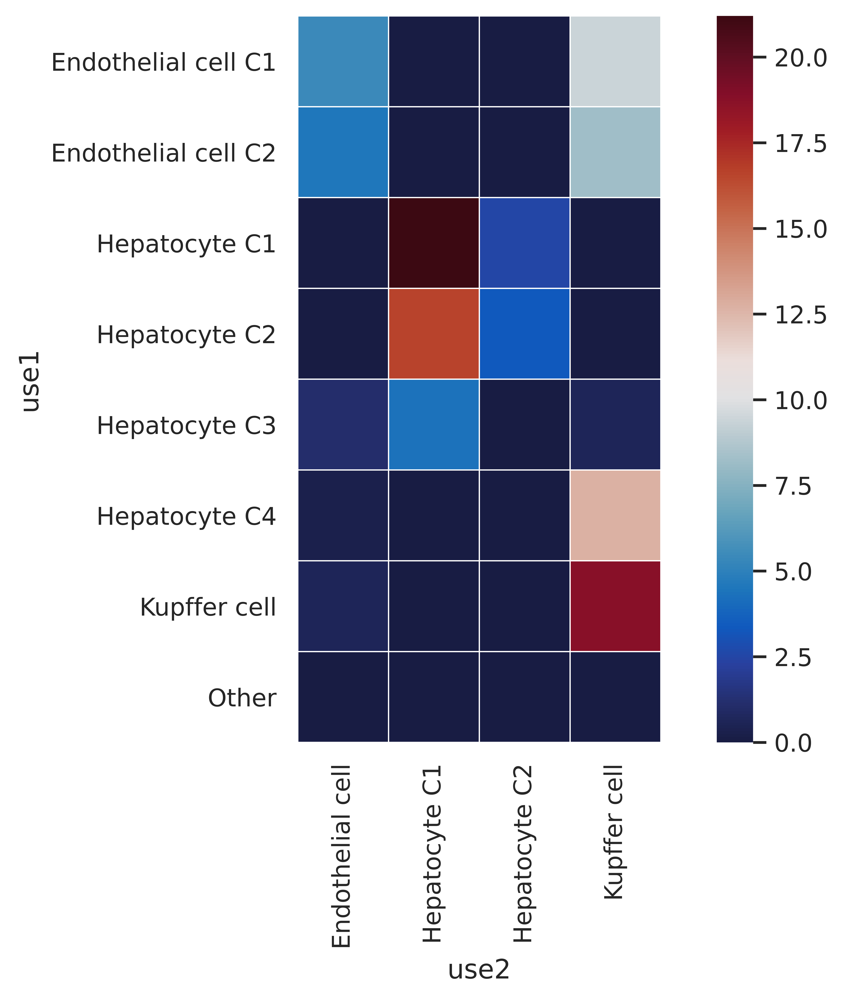

In [351]:
import matplotlib.pyplot as plt
import seaborn as sns
save_file = 'figures/Fig2/MIA_map.png'
sns.set()
flights_long = pd.DataFrame(pd_dict)
# index='foo', columns='bar', values='baz'
flights = flights_long.pivot(index="use1", columns="use2", values="pval")

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(flights, annot=False,  linewidths=.5, ax=ax,cmap=heatmap_cmp,square=True)
plt.savefig(save_file,transparent=True,format='png',bbox_inches='tight')


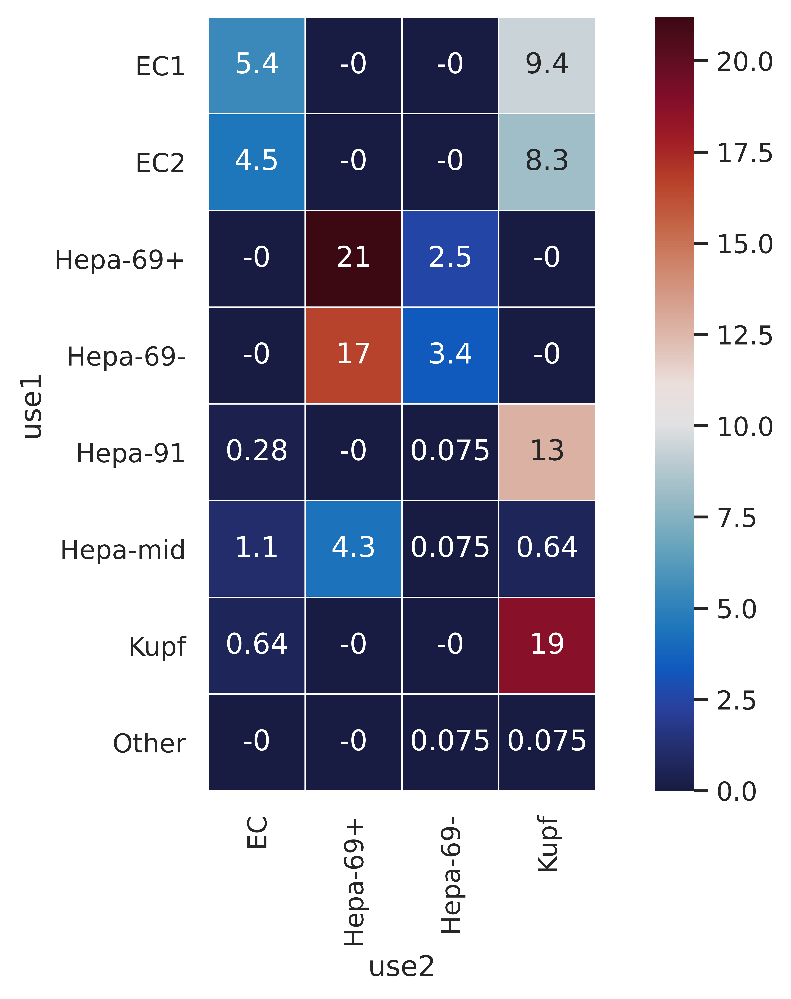

In [336]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
flights_long = pd.DataFrame(pd_dict)
# index='foo', columns='bar', values='baz'
flights = flights_long.pivot(index="use1", columns="use2", values="pval")

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(flights, annot=True,  linewidths=.5, ax=ax,cmap=heatmap_cmp,square=True)
